In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [71]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import image
from matplotlib import transforms
import seaborn as sns
import numpy as np
import scipy

import os
import anndata
import logging

import math

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [5]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_A1-1.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 9416 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [7]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [8]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [9]:
adata_aec

View of AnnData object with n_obs × n_vars = 167 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [10]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [11]:
temp = dendrogram(linkage_data,no_plot=True)

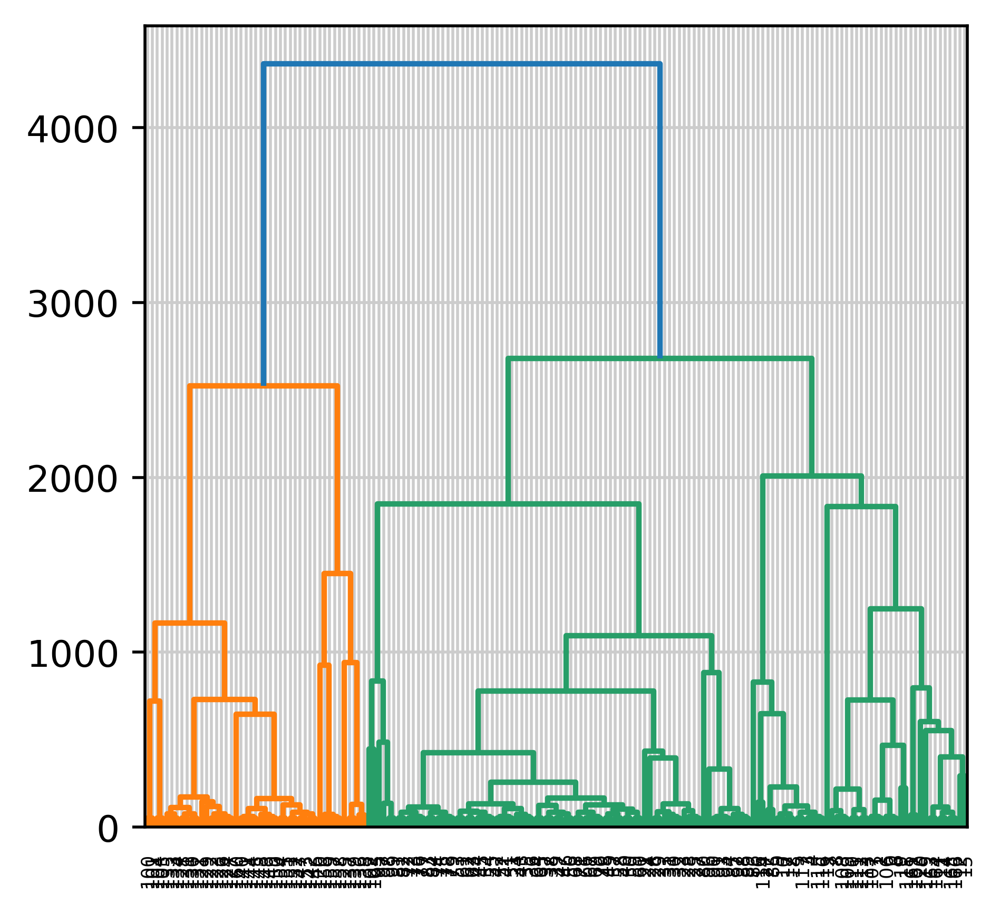

In [12]:
dendrogram(linkage_data)
plt.show()

In [13]:
adata_aec

View of AnnData object with n_obs × n_vars = 167 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [14]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=50, affinity='euclidean', linkage='single')

In [15]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[40 17 17 22 22 22 40 47 19 22 22 15 33 39 15 30 35 22 22 26 29 37 25 42
 28 10 10 10 10 10 10 10 10 10  7  7  7  7  7  7  7  7  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7
  9  9  9  9  9  9  9  9 43  9  9  9  9 12 31  2  2  2  2  2  2  2  2 48
 14 36  4  4 27 23 45 44 41 49 40 17 19 19 18 18 18 18 32 22 22 22 34 24
 13 38  0  0  0 11  0  0  0 20  0  0  0  0  0  0  5  8 21  8  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  3  3  3  3  6 16 46 15 15 15 15]


/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [16]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7756934.pbs/ipykernel_663594/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [17]:
adata_aec.obs['SMC_clusters'].value_counts()

7     38
1     16
0     12
9     12
22    10
10     9
2      8
15     6
3      4
18     4
19     3
17     3
40     3
4      2
8      2
32     1
42     1
43     1
44     1
47     1
41     1
45     1
46     1
39     1
38     1
48     1
37     1
36     1
35     1
34     1
33     1
25     1
31     1
30     1
5      1
6      1
11     1
12     1
13     1
14     1
16     1
20     1
21     1
23     1
24     1
26     1
27     1
28     1
29     1
49     1
Name: SMC_clusters, dtype: int64

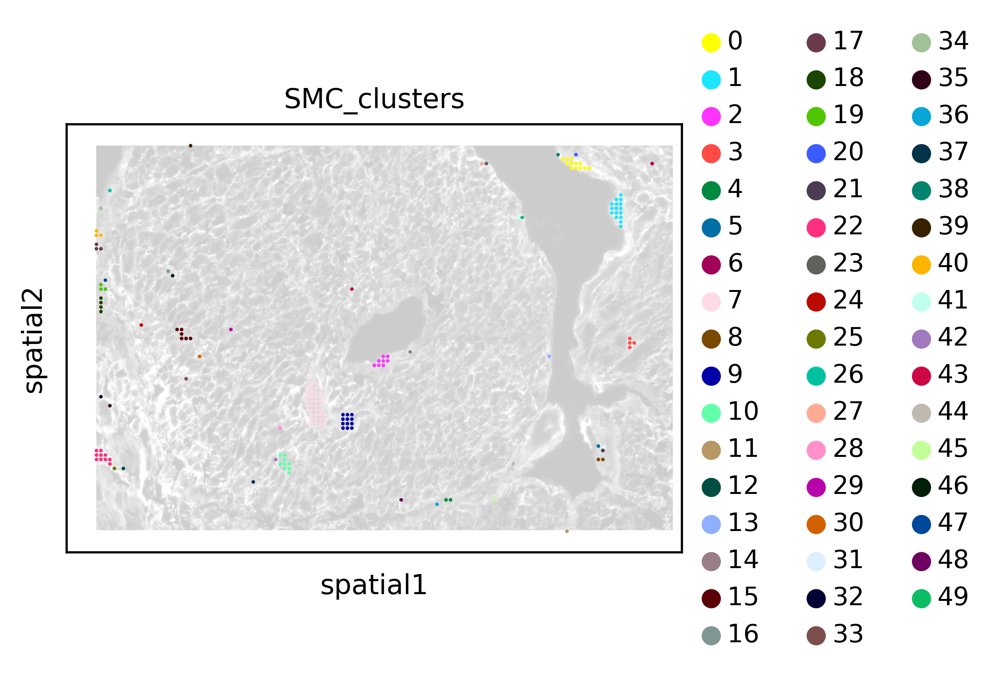

In [18]:
sc.pl.spatial(adata_aec, color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [19]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[7, 1, 0, 9, 22, 10, 2, 15]

In [20]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [21]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [22]:
adata_aec_subset

AnnData object with n_obs × n_vars = 111 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [23]:
#del adata_aec_subset.uns['SMC_clusters_colors']

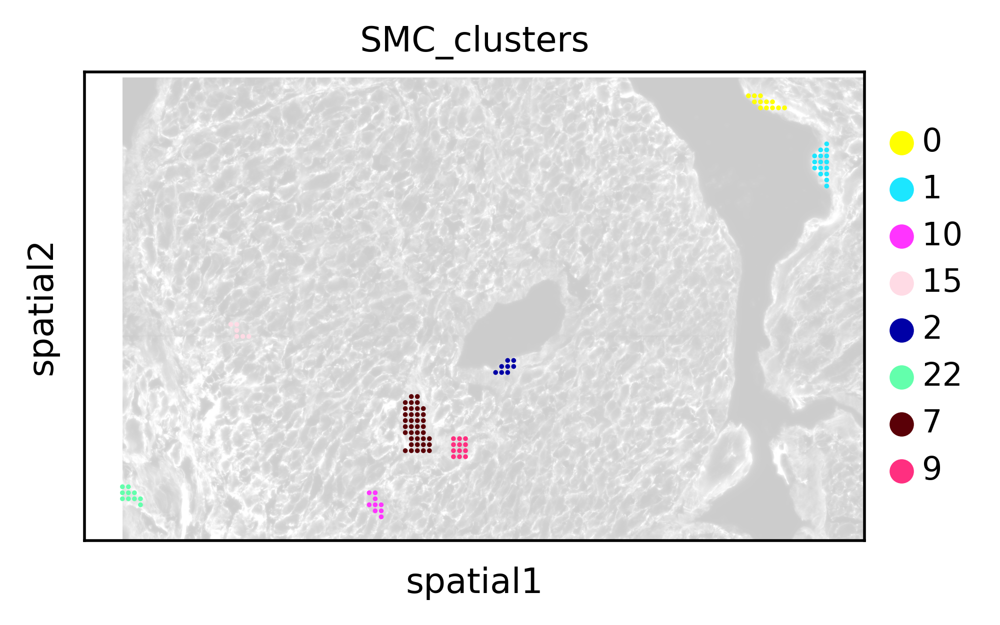

In [24]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

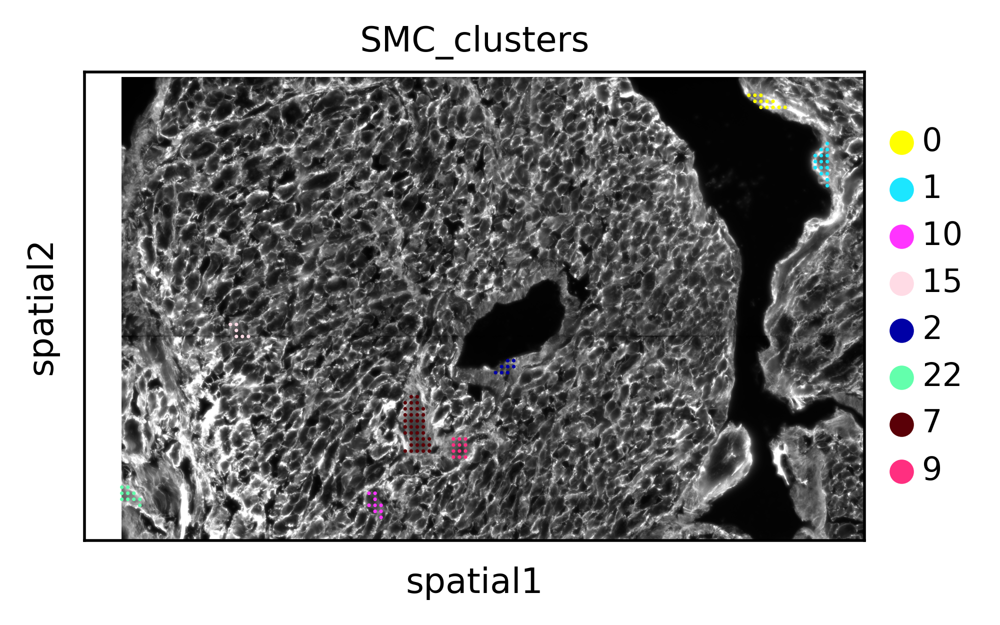

In [25]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

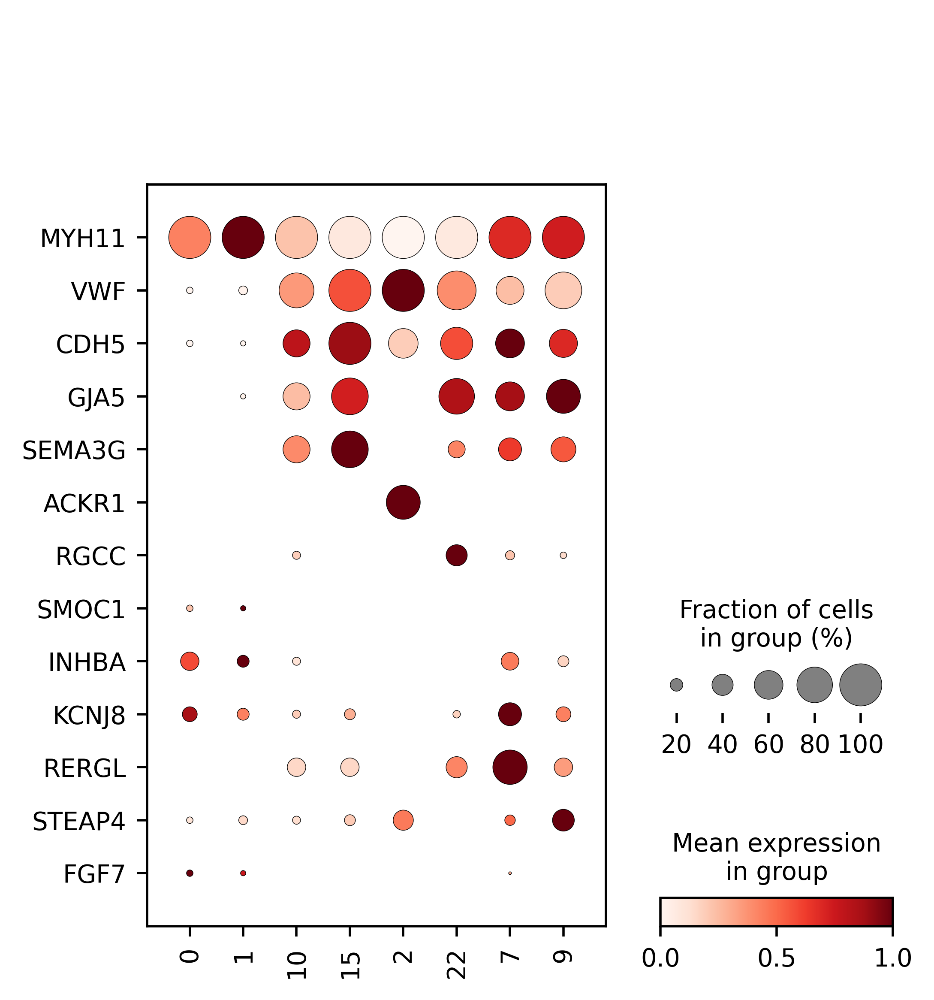

In [26]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [27]:
# add gene percentage expressed to dataframe

In [28]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [29]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [30]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [31]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [32]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [33]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [34]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [35]:
adata_aec_subset

AnnData object with n_obs × n_vars = 111 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [36]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [37]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333


In [38]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [39]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [40]:
matrix2 = matrix.replace(0, np.NaN)

In [41]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [42]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
0,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0
1,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0
10,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN
15,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN
2,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN
22,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN
7,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN
9,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN


### add expression values to dataframe

In [43]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [44]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN


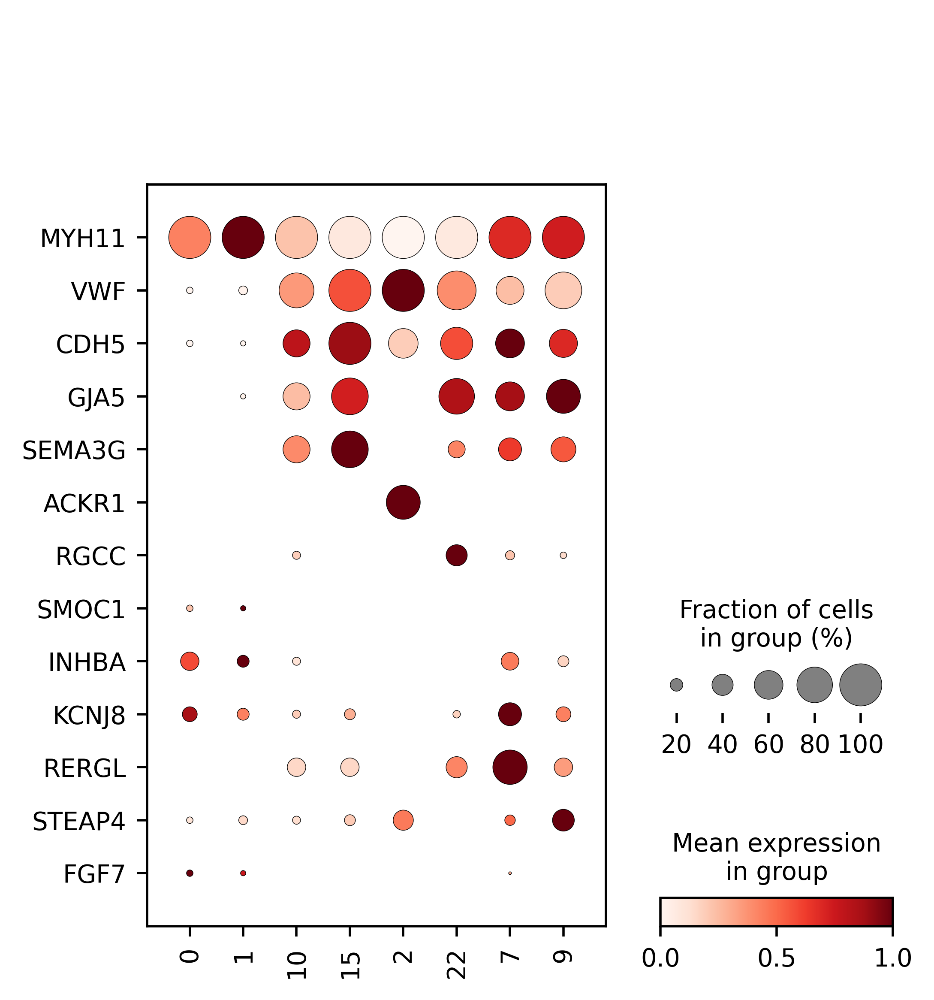

In [45]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [46]:
#add vessel type annotation column

In [47]:
test["Vessel"] = ['Subendocardium','Subendocardium','Artery','Artery','Vein','Artery','Artery','Artery']

In [48]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery


### add vessel size numbers

In [49]:
adata_aec_subset.obs.SMC_clusters.value_counts()

7     38
1     16
0     12
9     12
22    10
10     9
2      8
15     6
Name: SMC_clusters, dtype: int64

In [50]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [51]:
test2.columns = list(test.columns[0:17]) + ['size']

In [52]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium,12
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium,16
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery,9
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery,6
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein,8
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery,10
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery,38
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery,12


In [53]:
group=pd.Series("Large", index=test2.index)

In [54]:
group[test2["size"] <= 30] = "Small"

In [55]:
group

SMC_clusters
0     Small
1     Small
10    Small
15    Small
2     Small
22    Small
7     Large
9     Small
dtype: object

In [56]:
test2["group"] = group

In [57]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium,12,Small
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium,16,Small
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery,9,Small
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery,6,Small
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein,8,Small
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery,10,Small
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery,38,Large
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery,12,Small


In [58]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [59]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium,12,Small,Subendocardium_Small
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium,16,Small,Subendocardium_Small
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery,9,Small,Artery_Small
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery,6,Small,Artery_Small
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein,8,Small,Vein_Small
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery,10,Small,Artery_Small
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery,38,Large,Artery_Large
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery,12,Small,Artery_Small


### add ROI numbers

In [60]:
test2.index = ['ROI_A1-1_' + str(i) for i in test2.index.tolist()]

In [61]:
test2["ROI"] = "A1-1"

In [76]:
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 20)

In [63]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_A1-1_0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium,12,Small,Subendocardium_Small,A1-1
ROI_A1-1_1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium,16,Small,Subendocardium_Small,A1-1
ROI_A1-1_10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery,9,Small,Artery_Small,A1-1
ROI_A1-1_15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery,6,Small,Artery_Small,A1-1
ROI_A1-1_2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein,8,Small,Vein_Small,A1-1
ROI_A1-1_22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery,10,Small,Artery_Small,A1-1
ROI_A1-1_7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery,38,Large,Artery_Large,A1-1
ROI_A1-1_9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery,12,Small,Artery_Small,A1-1


[Text(0.5, 1.0, 'RERGL percentage expression')]

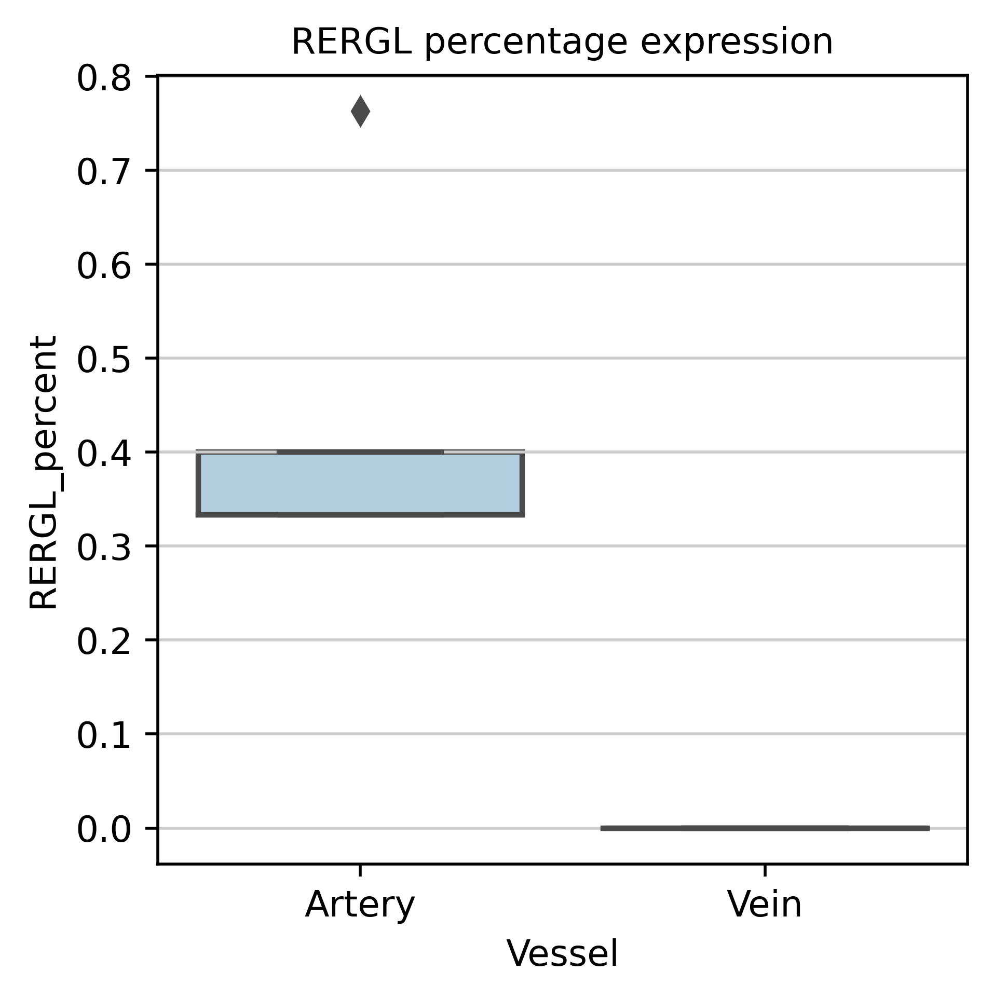

In [64]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

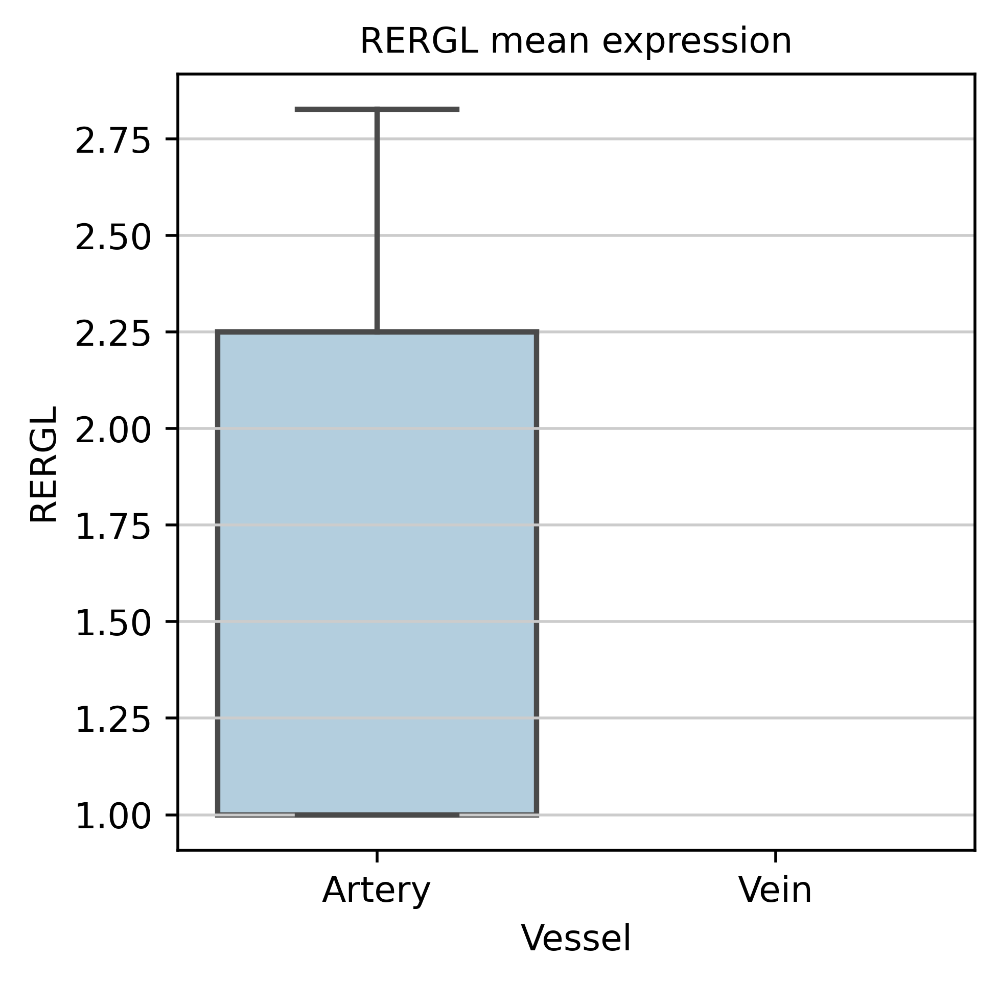

In [65]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

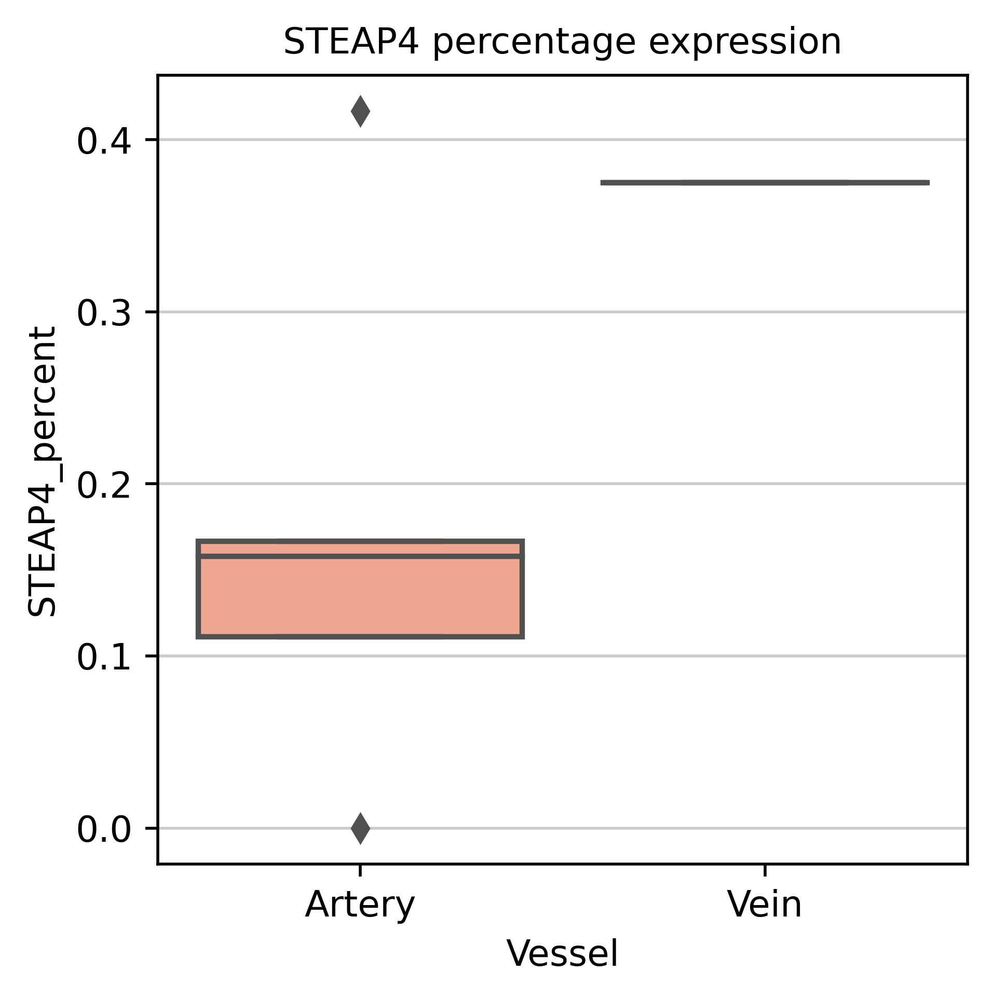

In [66]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

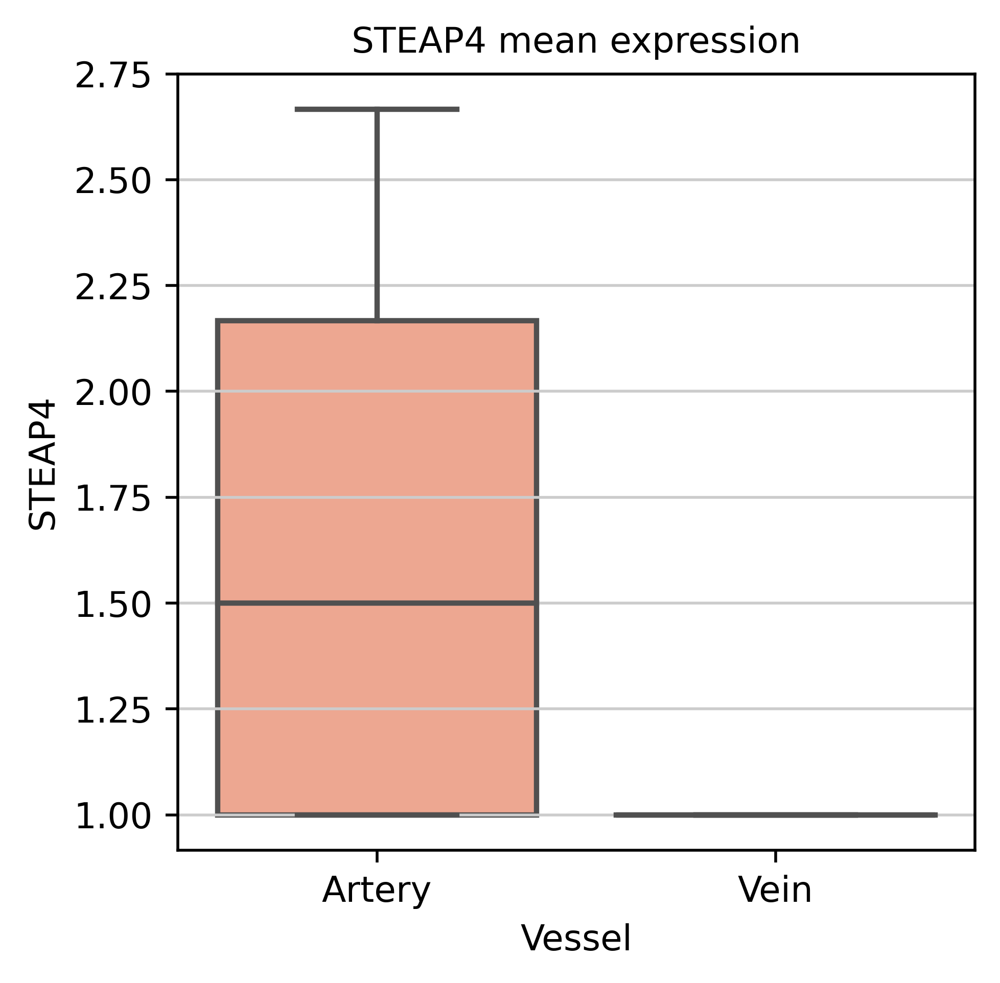

In [67]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [68]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
0,0.000000,0.083333,0.083333,0.250000,0.333333,0.000000,0.000000,NaN,1.000000,1.0,2.250000,2.000000,NaN,NaN,NaN,1.0,Subendocardium
1,0.000000,0.125000,0.062500,0.187500,0.062500,0.000000,0.000000,NaN,1.000000,1.0,1.000000,1.333333,NaN,NaN,NaN,6.0,Subendocardium
10,0.333333,0.111111,0.000000,0.111111,0.666667,0.000000,0.000000,1.000000,1.000000,NaN,2.666667,1.000000,1.200000,NaN,1.0,NaN,Artery
15,0.333333,0.166667,0.000000,0.166667,0.500000,0.000000,0.000000,1.000000,1.000000,NaN,1.333333,1.000000,2.000000,NaN,NaN,NaN,Artery
2,0.000000,0.375000,0.000000,0.000000,0.375000,0.000000,0.000000,NaN,1.000000,NaN,1.666667,NaN,NaN,1.833333,NaN,NaN,Vein
22,0.400000,0.000000,0.000000,0.100000,0.400000,0.000000,0.000000,2.250000,NaN,NaN,2.750000,1.000000,2.333333,NaN,1.5,NaN,Artery
7,0.763158,0.157895,0.026316,0.447368,0.815789,0.026316,0.026316,2.827586,2.666667,1.0,8.000000,1.294118,2.352941,NaN,1.0,NaN,Artery
9,0.333333,0.416667,0.000000,0.250000,0.916667,0.000000,0.083333,2.250000,2.000000,NaN,3.727273,1.000000,1.833333,NaN,1.0,NaN,Artery


# Create raw object (no binning) and add annotations from binned

In [73]:
path_in="/rds/general/user/snb20/projects/noseda_microscopy/live/Resolve/33175-slide1561-1_submission/33175-slide1561-1_submission/"

In [74]:
raw=pd.read_csv(path_in+"33175-slide1561-1_A1-1_results.txt",sep="\t",names=["X","Y","Z","Gene","Empty"])

In [77]:
raw

,X,Y,Z,Gene,Empty
0,1487,1333,12,ITLN1,NaN
1,1668,735,12,ITLN1,NaN
2,138,327,14,ITLN1,NaN
3,1155,324,14,ITLN1,NaN
4,1729,668,15,ITLN1,NaN
...,...,...,...,...,...
255630,4564,2619,36,ADGRD1,NaN
255631,4804,4067,36,ADGRD1,NaN
255632,5706,3593,36,ADGRD1,NaN
255633,5938,4143,37,ADGRD1,NaN


In [78]:
raw["X_Y_Z"]=raw["X"].astype(str)+"_"+raw["Y"].astype(str)+"_"+raw["Z"].astype(str)

In [79]:
raw

,X,Y,Z,Gene,Empty,X_Y_Z
0,1487,1333,12,ITLN1,NaN,1487_1333_12
1,1668,735,12,ITLN1,NaN,1668_735_12
2,138,327,14,ITLN1,NaN,138_327_14
3,1155,324,14,ITLN1,NaN,1155_324_14
4,1729,668,15,ITLN1,NaN,1729_668_15
...,...,...,...,...,...,...
255630,4564,2619,36,ADGRD1,NaN,4564_2619_36
255631,4804,4067,36,ADGRD1,NaN,4804_4067_36
255632,5706,3593,36,ADGRD1,NaN,5706_3593_36
255633,5938,4143,37,ADGRD1,NaN,5938_4143_37


In [80]:
matrix=pd.crosstab(raw["X_Y_Z"],raw["Gene"])

In [81]:
matrix
#number of rows should be the same as in raw

Gene,ACKR1,ADGRA3,ADGRD1,ADGRL1,ADGRL3,ADRB1,AGT,AGTR1,BNC1,C1QA,...,TBX3,TCF15,TFF3,TH,TIMD4,TTN,VCAM1,VIP,VIPR2,VWF
X_Y_Z,,,,,,,,,,,,,,,,,,,,,
0_2369_22,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
0_2371_25,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
0_2388_16,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
0_2495_19,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0_2509_30,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_843_24,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9_874_21,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9_876_28,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [82]:
matrix.replace(0, np.nan, inplace=True) # replace 0 with nan for better plotting down the line

In [83]:
matrix

Gene,ACKR1,ADGRA3,ADGRD1,ADGRL1,ADGRL3,ADRB1,AGT,AGTR1,BNC1,C1QA,...,TBX3,TCF15,TFF3,TH,TIMD4,TTN,VCAM1,VIP,VIPR2,VWF
X_Y_Z,,,,,,,,,,,,,,,,,,,,,
0_2369_22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0_2371_25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0_2388_16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0_2495_19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0_2509_30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_843_24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9_874_21,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9_876_28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
adata=sc.AnnData(X=np.array(matrix),var=list(matrix.columns),obs=list(matrix.index))

/var/tmp/pbs.7756934.pbs/ipykernel_663594/526111409.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata=sc.AnnData(X=np.array(matrix),var=list(matrix.columns),obs=list(matrix.index))


In [85]:
adata.obs

,0
0,0_2369_22
1,0_2371_25
2,0_2388_16
3,0_2495_19
4,0_2509_30
...,...
255630,9_843_24
255631,9_874_21
255632,9_876_28
255633,9_896_27


In [86]:
adata.obs["coord"]=adata.obs[0]

In [87]:
del adata.obs[0]

In [88]:
adata.obs.index=adata.obs["coord"]

In [89]:
raw2=raw.sort_values(by="X_Y_Z",ascending=True)

In [90]:
raw2

,X,Y,Z,Gene,Empty,X_Y_Z
159990,0,2369,22,C1QA,NaN,0_2369_22
160272,0,2371,25,C1QA,NaN,0_2371_25
159720,0,2388,16,C1QA,NaN,0_2388_16
155558,0,2495,19,GLUL,NaN,0_2495_19
146414,0,2509,30,TTN,NaN,0_2509_30
...,...,...,...,...,...,...
35903,9,843,24,C1QA,NaN,9_843_24
22684,9,874,21,ADRB1,NaN,9_874_21
36030,9,876,28,C1QA,NaN,9_876_28
22837,9,896,27,ADRB1,NaN,9_896_27


In [91]:
adata.obs["Bin_50"]=np.asarray(raw2["X_Y_bins"].astype(str)) #if using normalised bins, substitute "X_Y_bins" with whatever column you wish to use

KeyError: 'X_Y_bins'

In [ ]:
adata.obs[['X_coor', 'Y_coor',"Z_coor"]] = adata.obs["coord"].apply(lambda x: pd.Series(str(x).split("_")))

In [164]:
adata.obs

,coord,Bin_50,X_coor,Y_coor,Z_coor
coord,,,,,
0_2369_22,0_2369_22,0.0_2350.0,0,2369,22
0_2371_25,0_2371_25,0.0_2350.0,0,2371,25
0_2388_16,0_2388_16,0.0_2400.0,0,2388,16
0_2495_19,0_2495_19,0.0_2500.0,0,2495,19
0_2509_30,0_2509_30,0.0_2500.0,0,2509,30
...,...,...,...,...,...
9_843_24,9_843_24,0.0_850.0,9,843,24
9_874_21,9_874_21,0.0_850.0,9,874,21
9_876_28,9_876_28,0.0_900.0,9,876,28


In [165]:
adata.var["Genes"]=adata.var[0]
del adata.var[0]
adata.var.index=adata.var["Genes"]

In [166]:
adata.var

,Genes
Genes,
ACKR1,ACKR1
ADGRA3,ADGRA3
ADGRD1,ADGRD1
ADGRL1,ADGRL1
ADGRL3,ADGRL3
...,...
TTN,TTN
VCAM1,VCAM1
VIP,VIP


In [167]:
adata.X=scipy.sparse.csr_matrix(adata.X)

In [168]:
adata.X

<255635x96 sparse matrix of type '<class 'numpy.float32'>'
	with 24540960 stored elements in Compressed Sparse Row format>

In [169]:
# this step will take much longer than when binning
obsm=[]
loop=0
for i in adata.obs.index:
    tmp=adata.obs[adata.obs.index.isin([i])].copy()
    coor1=int(float(np.asarray(tmp["X_coor"])))
    coor2=int(float(np.asarray(tmp["Y_coor"])))
    tmp2=np.append(coor1,coor2)
    obsm=np.append(obsm,tmp2)
    loop=loop+1
obsm=np.asarray(np.split(obsm,loop))

In [170]:
adata.obsm["spatial"]=obsm
#the image data has been converted to RGB on imageJ. Otherwise it loads as grayscale and plots on a color map
dapi = image.imread(path_in+"33175-slide1561-1_A1-1_DAPI_test.tif")
wga = image.imread(path_in+"33175-slide1561-1_A1-1_WGA_test.tif")
bright = image.imread(path_in+"33175-slide1561-1_A1-1_brightfield_test.tif")
merged= image.imread(path_in+"33175-slide1561-1_A1-1_WGA_DAPI_test.tif")
adata.uns["spatial"]=({'33175-slide1561-1_A1-1': {'images': {'DAPI':dapi,"WGA":wga,"Brightfield":bright,"WGADAPI":merged},
                        'scalefactors':{'tissue_DAPI_scalef': 1,'tissue_WGA_scalef': 1,'tissue_Brightfield_scalef': 1,'tissue_WGADAPI_scalef': 1,"fiducial_diameter_fullres": 5,'spot_diameter_fullres': 5}}})


In [171]:
adata.X=np.array(matrix)

In [172]:
adata.raw=adata

In [173]:
to_replace=pd.Series(utag_results.obs["UTAG Label_leiden_0.3"],index=utag_results.obs.index).to_dict()

In [174]:
adata.obs["cluster"]=adata.obs.Bin_50.replace(to_replace)

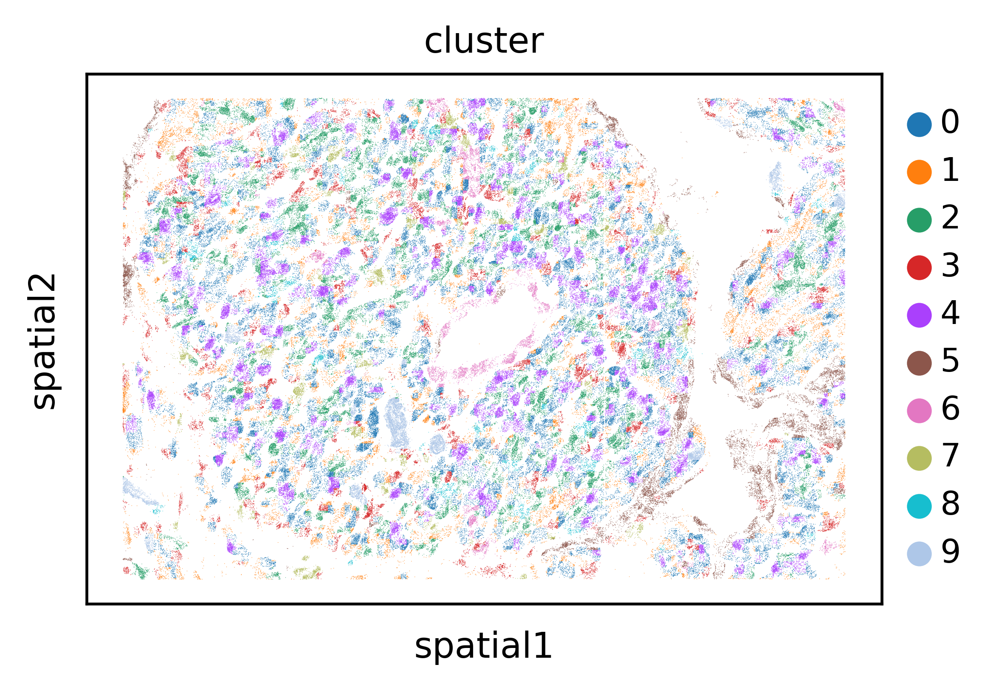

In [175]:
sc.pl.spatial(adata,color="cluster",img_key=None,size=1)